In [1]:
%%capture
!pip install scanpy
!pip install KDEpy
!pip install leidenalg

In [2]:
import os
import sys

import pandas as pd
import scanpy as sc
import anndata as ad
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.sparse as sps
from scipy.stats import spearmanr

# to be able to import from tools dir
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)

# os.environ['R_HOME'] = "/Library/Frameworks/R.framework/Resources"
# import pertpy as pt
    
import tools.util_probe as up
import tools.util as ut
import tools.NB_est as nb
import tools.countsplit as cs
import tools.scDEED as scd
import tools.clustering_opt as co
import tools.util_plot as nmd_plot
from tools import NMD as nmd

import warnings
warnings.filterwarnings("ignore")

import importlib

In [3]:
from scipy.stats import kendalltau, spearmanr

In [4]:
def plot_reconstruction(
    X_reconstruction, X,hue=None, type="scatter", sample_fraction=None
):
    """Plot original sparse non-negative matrix against the reconstructed one

    Also computes the Pearson correlation between both

    Args:
        X_reconstruction (_type_): Reconstructed matrix, e.g. np.maximum(0, Theta)
        X (_type_): The original sparse non-negative matrix
        title (_type_): _description_
        type (str, optional): _description_. Defaults to "scatter".
        sample_fraction (_type_, optional): _description_. Defaults to None.
    """
    X_recon_max = np.max(X_reconstruction)
    X_max = np.max(X)
    max_axis = max(X_recon_max, X_max)
    #correlation = np.corrcoef(X_reconstruction.flatten(), X.flatten())[0][1]

    df = pd.DataFrame(
        {"original": X.flatten(), "reconstruction": X_reconstruction.flatten().round(0)}
    )
    
    correlation = kendalltau(df["original"], df["reconstruction"]).statistic

    if sample_fraction:
        df = df.sample(frac=sample_fraction, axis=0)

    fig, ax = plt.subplots()
    match type:
        case "scatter":
            if hue is not None:
                p = sns.scatterplot(data=df, x="reconstruction", y="original", hue=hue, alpha=0.05)
            else:
                p = sns.scatterplot(data=df, x="reconstruction", y="original", alpha=0.05)
        # case "kde":
        # p = sns.kdeplot(X_reconstruction.flatten(), X.flatten())
        # p = sns.kdeplot(data=df, x="reconstruction", y="original")
    #p.set_ylim(0, max_axis)
    #p.set_xlim(0, max_axis)
    #plt.suptitle(title)
    plt.title(f"Kendall's tau: {round(correlation, 3)}")
    plt.xlabel("Reconstruction")
    plt.ylabel("Original data")
    ax.axline(xy1=(0, 0), slope=1, linewidth=1, color="r")
    plt.show()


In [5]:
data_all_pca = sc.read_h5ad("../../data/MOBA_scRNAseq/MOBA_intermediate_results/export_s3.h5ad")
data_all_pca

AnnData object with n_obs × n_vars = 1544 × 5553
    obs: 'total_counts', 'n_genes_by_counts', 'leiden_opt'
    var: 'total_counts', 'n_cells_by_counts', 'TU_ID', 'nb_overdisp_cutoff', 'pval_cluster_0', 'pval_cluster_1', 'pval_cluster_2', 'pval_cluster_3'
    uns: 'leiden', 'leiden_opt_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [6]:
data_all_pca.varm["PCs"].shape

(5553, 50)

In [7]:
data_counts = sc.read_h5ad("../../data/MOBA_scRNAseq/MOBA_intermediate_results/S3_filtered_with_counts.h5ad")
data_counts

AnnData object with n_obs × n_vars = 1544 × 5553
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp', 'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs', 'mean', 'std'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts', 'vst_counts'

In [8]:
importlib.reload(nmd_plot)

<module 'tools.util_plot' from '/dss/dsshome1/07/di35buw/NMD/BacSC/tools/util_plot.py'>

In [9]:
data_all_pca.uns["leiden_opt_colors"]

array(['#1f77b4', '#d62728', '#e377c2', '#17becf'], dtype=object)

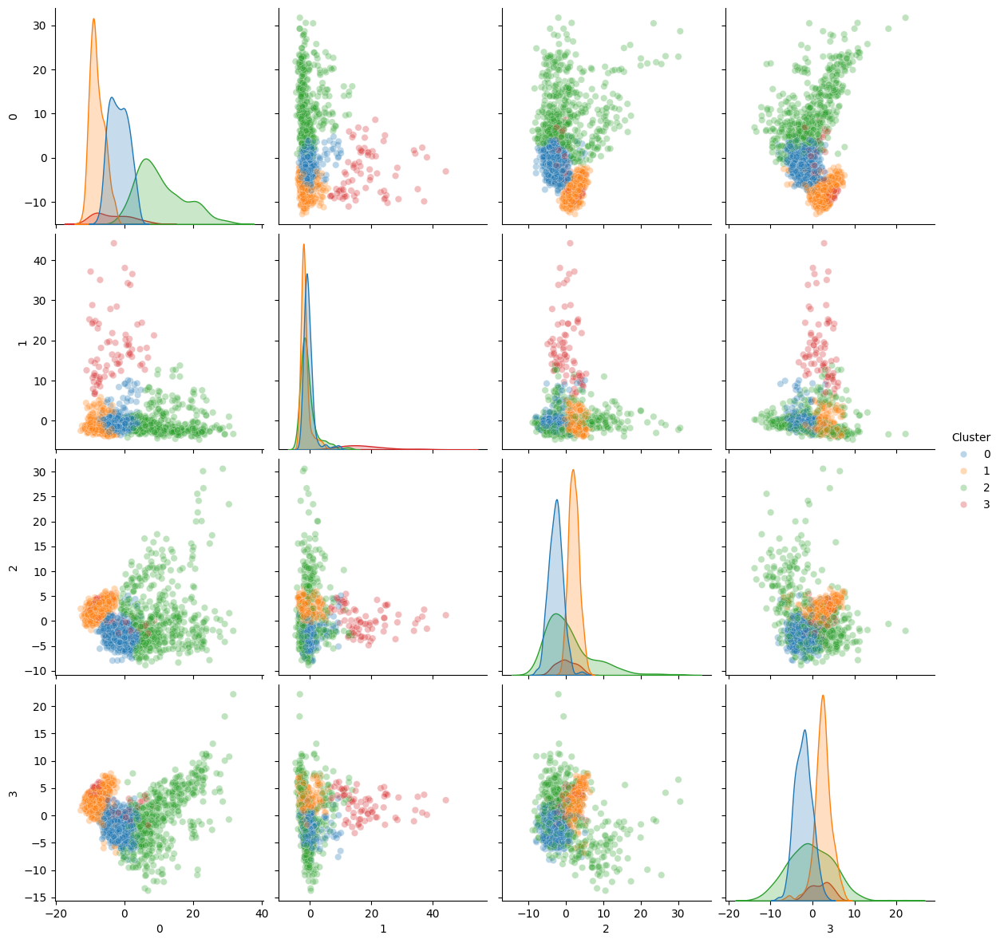

In [10]:
nmd_plot.plot_embedding_grid(data_all_pca.obsm["X_pca"][:,:4], hue=data_all_pca.obs["leiden_opt"], size=3)

## Fit NMD

In [11]:
k_opt = 8 # to match pca
k_throw_away = 1
beta_opt = 0.5
data_layer = "counts"

In [12]:
m, n = data_counts.X.shape
X_nmd = ut.convert_to_dense_counts(data_counts, layer=data_layer)
m, n = X_nmd.shape
W0, H0 = cs.nuclear_norm_init(X_nmd, m, n, k_opt)
Theta0 = W0 @ H0

In [13]:
np.sum(X_nmd == 0) / X_nmd.size

0.8624071477024509

In [14]:
Theta_3b, W_3b, H_3b, loss_3b, iters_3b, times_3b = nmd.nmd_3b(X_nmd, r=k_opt, W0=W0, H0=H0, beta1=beta_opt, tol_over_10iters=1e-4)

Running 3B-NMD, evolution of [iteration number : relative error in %] - time per iteration
[0 : 49.428227] - 0.370672 secs
[1 : 49.070210] - 0.366889 secs
[2 : 48.887076] - 0.369247 secs
[3 : 48.807227] - 0.368710 secs
[4 : 48.773406] - 0.365625 secs
[5 : 48.753875] - 0.369181 secs
[6 : 48.740437] - 0.371650 secs
[7 : 48.731442] - 0.365906 secs
[8 : 48.724797] - 0.368518 secs
[9 : 48.719606] - 0.371001 secs
[10 : 48.715372] - 0.365781 secs
[11 : 48.711781] - 0.371327 secs
[12 : 48.708578] - 0.368708 secs
[13 : 48.705575] - 0.367584 secs
[14 : 48.702653] - 0.370852 secs
[15 : 48.699623] - 0.368587 secs
[16 : 48.696434] - 0.365802 secs
[17 : 48.693040] - 0.370287 secs
[18 : 48.689359] - 0.368234 secs
[19 : 48.685340] - 0.366108 secs
[20 : 48.680962] - 0.368462 secs
[21 : 48.676173] - 0.370782 secs
[22 : 48.670930] - 0.365925 secs
[23 : 48.665249] - 0.368786 secs
[24 : 48.659131] - 0.368495 secs
[25 : 48.652585] - 0.366248 secs
[26 : 48.645660] - 0.369403 secs
[27 : 48.638431] - 0.373502 

In [15]:
importlib.reload(nmd_plot)

<module 'tools.util_plot' from '/dss/dsshome1/07/di35buw/NMD/BacSC/tools/util_plot.py'>

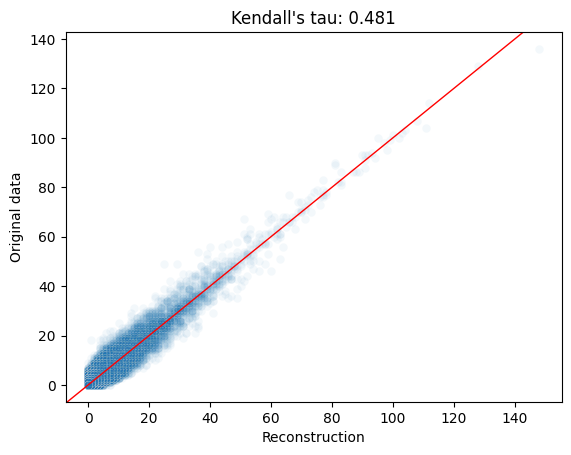

In [16]:
plot_reconstruction(np.maximum(0, W0@H0), X_nmd)

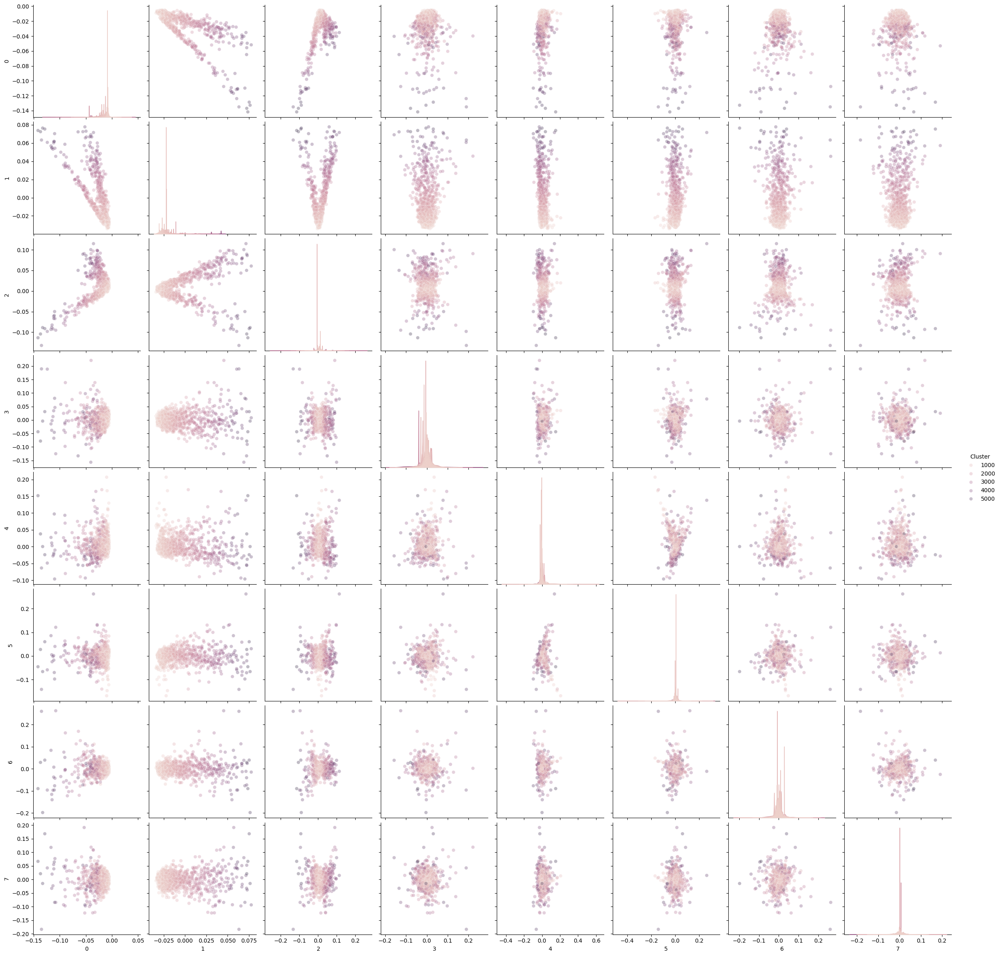

In [17]:
nmd_plot.plot_embedding_grid(W0, hue=data_counts.obs["total_counts"], size=3, hue_label="Sequencing depth")

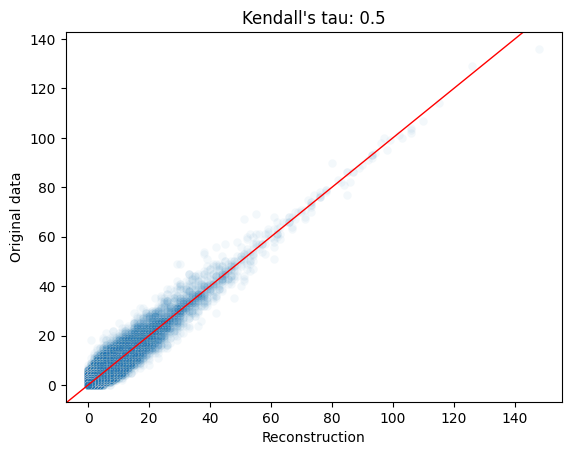

In [18]:
plot_reconstruction(np.maximum(0, W_3b@H_3b), X_nmd)

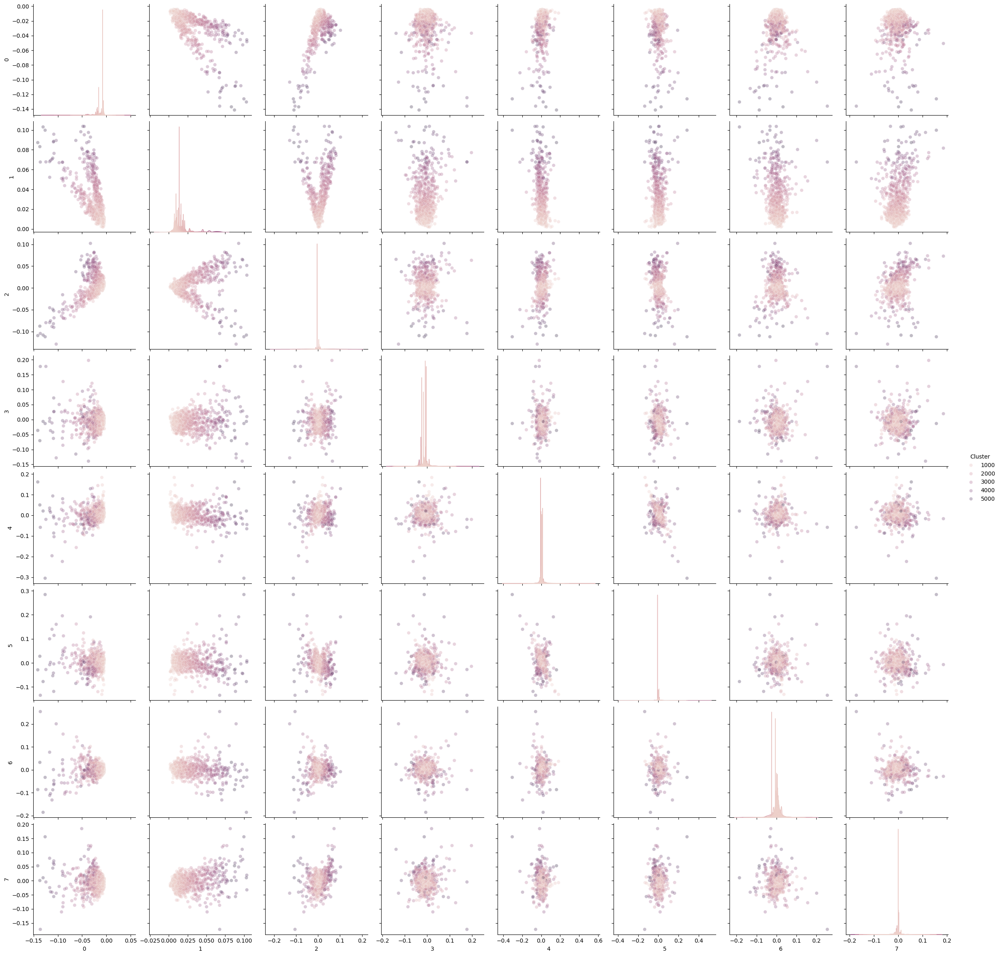

In [19]:
nmd_plot.plot_embedding_grid(W_3b, hue=data_counts.obs["total_counts"], size=3)

In [20]:
data_counts

AnnData object with n_obs × n_vars = 1544 × 5553
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp', 'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs', 'mean', 'std'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts', 'vst_counts'

Cluster 3: vermutlich selbes expression profile aber geringere Sequencingdepth

<Axes: >

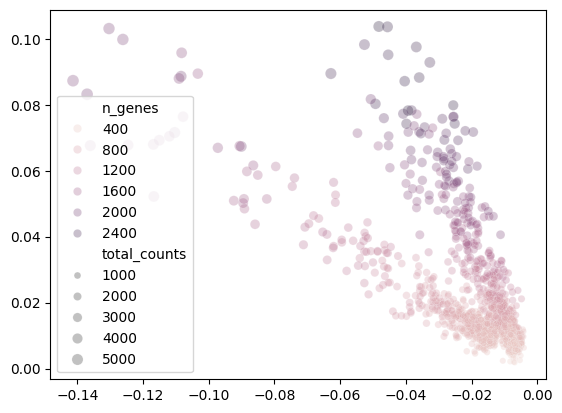

In [21]:
sns.scatterplot(x = W_3b[:,0], y=W_3b[:,1], 
                size=data_counts.obs["total_counts"], 
                alpha=0.3, hue=data_counts.obs["n_genes"], legend="brief")

In [22]:
df_seq_depth_emb = pd.DataFrame(
    {"NMD Dim 0": W_3b[:,0], 
     "NMD Dim 1": W_3b[:,1], 
     "Sequencing Depth": data_counts.obs["total_counts"],
    "Number of expressed genes": data_counts.obs["n_genes"]}
)

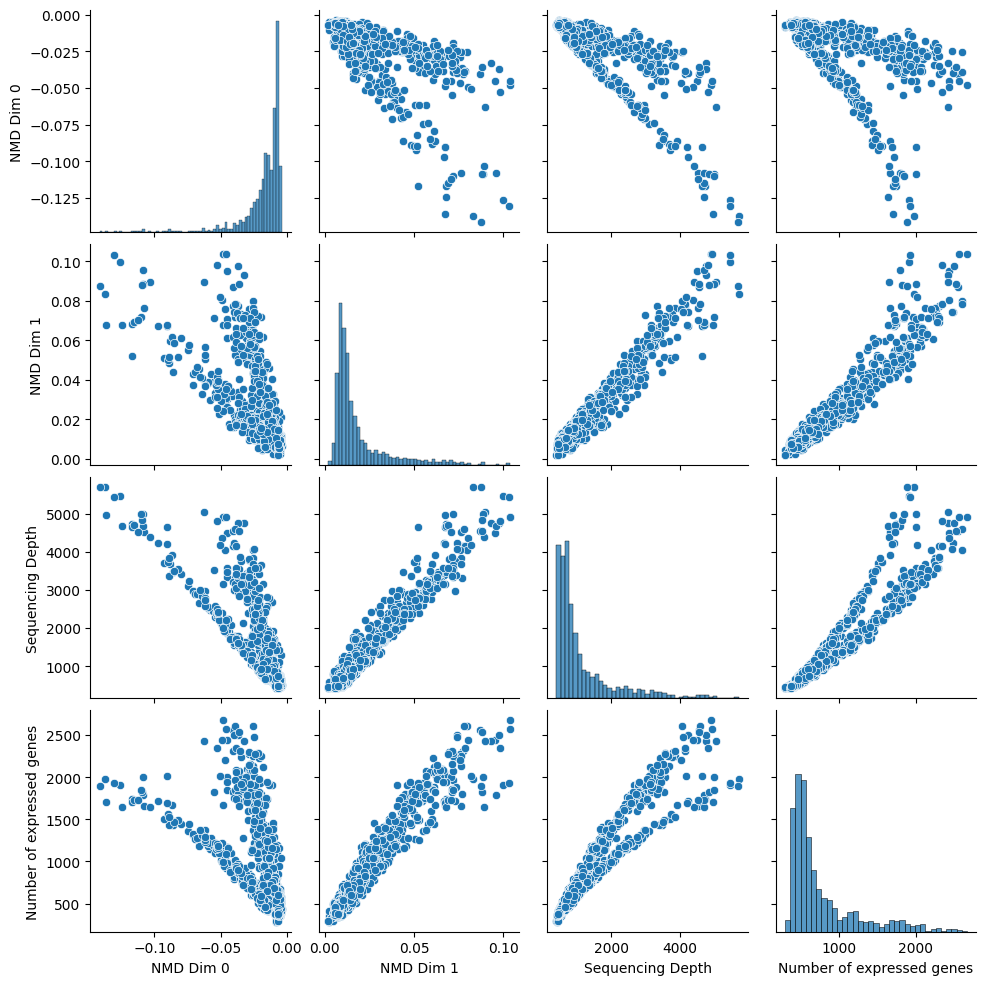

In [23]:
sns.pairplot(df_seq_depth_emb)

In [24]:
data_train, data_test = cs.countsplit_adata(data_counts, data_dist="NB", beta_key="nb_overdisp_cutoff", layer="counts", min_genes=1, max_counts=1e9, seed=1234)

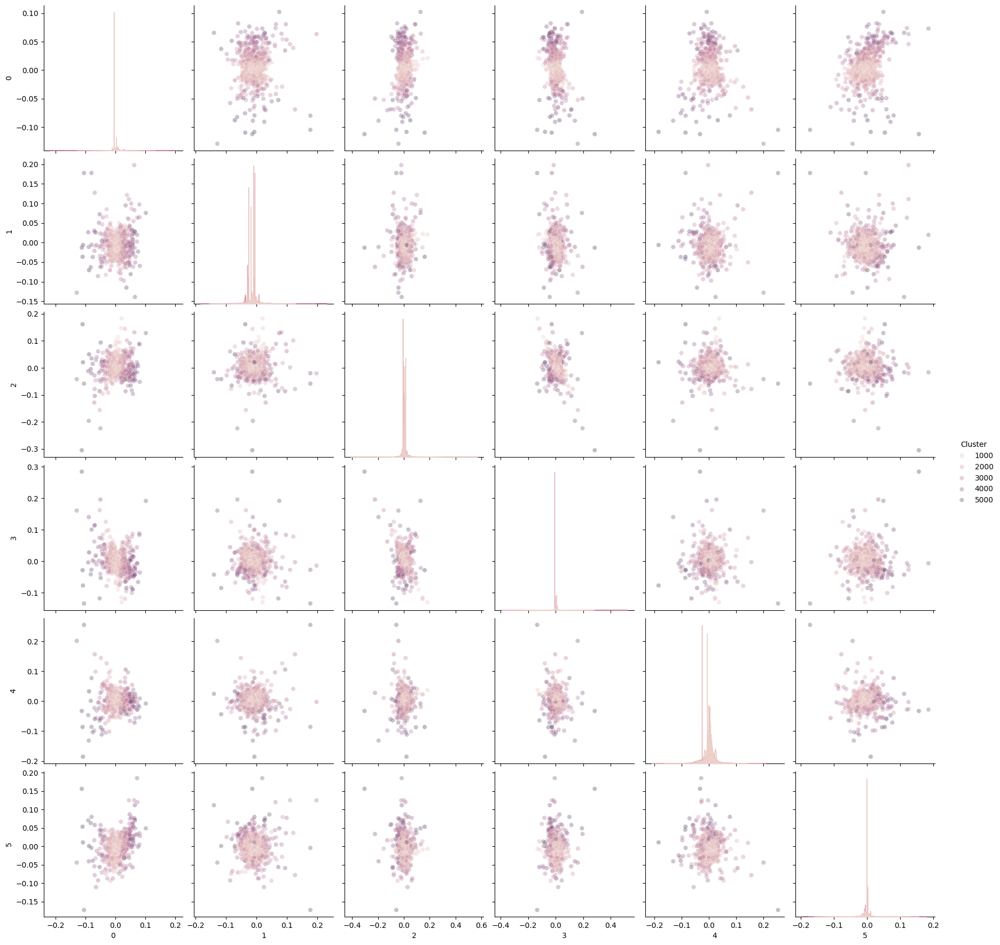

In [25]:
nmd_plot.plot_embedding_grid(W_3b[:, 2:], hue=data_counts.obs["total_counts"], size=3)

In [26]:
#data_counts.obsm["X_3b"] = W_3b[:, 2:].copy()
data_counts.obsm["X_3b"] = np.delete(W_3b, 0, 1)

In [27]:
data_counts.obsm["X_3b"].shape

(1544, 7)

In [54]:
importlib.reload(scd)

n_neighborss = [10, 15, 20, 25, 30, 35, 40, 45, 50, 60, 70, 80, 90, 100, 150, 200, 250]
min_dists = [0.05, 0.1, 0.3, 0.5, 0.7]

scdeed_result, rel_scores, null_rel_scores, reliabilities, n_neighbors_opt, min_dist_opt = scd.scdeed_parameter_selection(
    data_counts, n_neighborss, min_dists, n_pcs=k_opt, rng_seed=5678, layer = "counts",
    embedding_method="UMAP", similarity_percent=0.5, save_path="S2_filtered_scdeed_nmd")

calculating (10, 0.05) - run 1/85
calculating (10, 0.1) - run 2/85
calculating (10, 0.3) - run 3/85
calculating (10, 0.5) - run 4/85
calculating (10, 0.7) - run 5/85
calculating (15, 0.05) - run 6/85
calculating (15, 0.1) - run 7/85
calculating (15, 0.3) - run 8/85
calculating (15, 0.5) - run 9/85
calculating (15, 0.7) - run 10/85
calculating (20, 0.05) - run 11/85
calculating (20, 0.1) - run 12/85
calculating (20, 0.3) - run 13/85
calculating (20, 0.5) - run 14/85
calculating (20, 0.7) - run 15/85
calculating (25, 0.05) - run 16/85
calculating (25, 0.1) - run 17/85
calculating (25, 0.3) - run 18/85
calculating (25, 0.5) - run 19/85
calculating (25, 0.7) - run 20/85
calculating (30, 0.05) - run 21/85
calculating (30, 0.1) - run 22/85
calculating (30, 0.3) - run 23/85
calculating (30, 0.5) - run 24/85
calculating (30, 0.7) - run 25/85
calculating (35, 0.05) - run 26/85
calculating (35, 0.1) - run 27/85
calculating (35, 0.3) - run 28/85
calculating (35, 0.5) - run 29/85
calculating (35, 

Optimal number of neighbors: 35
Optimal min_dist: 0.7


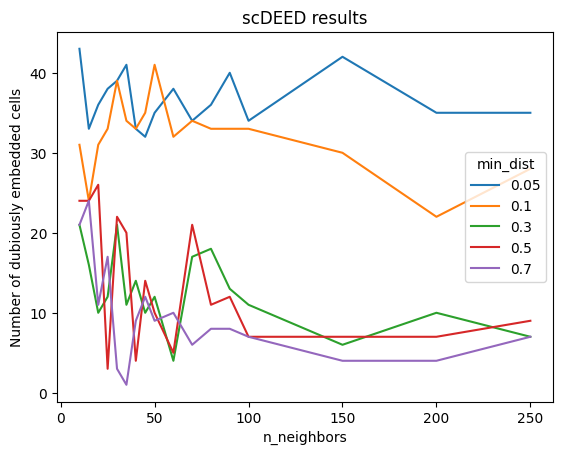

In [55]:
print(f"Optimal number of neighbors: {n_neighbors_opt}")
print(f"Optimal min_dist: {min_dist_opt}")

sns.lineplot(data=scdeed_result, x="n_neighbors", y="num_dubious", hue="min_dist", palette="tab10")
plt.title("scDEED results")
plt.ylabel("Number of dubiously embedded cells")
plt.show()

In [56]:
sc.pp.neighbors(data_counts, n_neighbors=n_neighbors_opt, n_pcs=(k_opt-k_throw_away), use_rep="X_3b")
sc.tl.umap(data_counts, neighbors_key="neighbors", min_dist=min_dist_opt, spread=1)

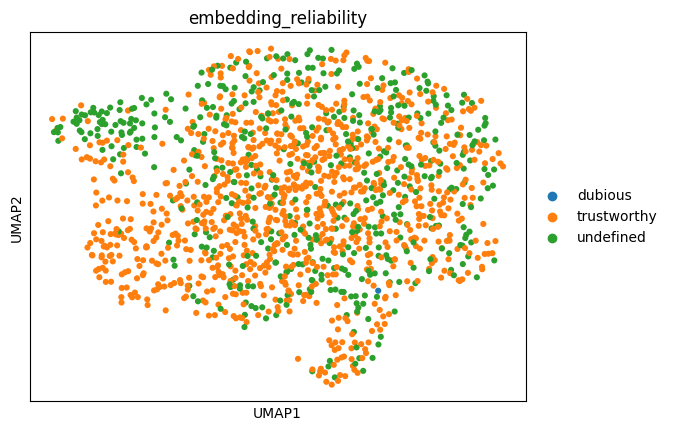

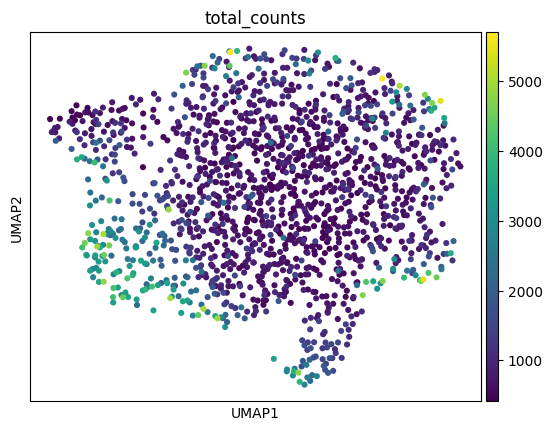

In [57]:
sc.pl.umap(data_counts, color="embedding_reliability", alpha=1)
plt.show()

sc.pl.umap(data_counts, color="total_counts", alpha=1, cmap="viridis")
plt.show()

In [58]:
X_train = ut.convert_to_dense_counts(data_train, layer=data_layer)
m, n = X_train.shape
W0_train, H0_train = cs.nuclear_norm_init(X_train, m, n, k_opt)

In [59]:
X_test = ut.convert_to_dense_counts(data_test, layer=data_layer)
m, n = X_test.shape
W0_test, H0_test = cs.nuclear_norm_init(X_test, m, n, k_opt)

In [60]:
_, W_train, H_train,  _, _, _ = nmd.nmd_3b(X_train, r=k_opt, W0=W0_train, H0=H0_train, beta1=.5)

Running 3B-NMD, evolution of [iteration number : relative error in %] - time per iteration
[0 : 63.088477] - 0.365538 secs
[1 : 62.589595] - 0.364398 secs
[2 : 62.344205] - 0.374682 secs
[3 : 62.136974] - 0.363086 secs
[4 : 62.006328] - 0.370831 secs
[5 : 61.949948] - 0.368484 secs
[6 : 61.926546] - 0.364022 secs
[7 : 61.912710] - 0.364243 secs
[8 : 61.902598] - 0.367139 secs
[9 : 61.895187] - 0.364250 secs
[10 : 61.889842] - 0.363671 secs
[11 : 61.885841] - 0.368683 secs
[12 : 61.882549] - 0.365346 secs
[13 : 61.879822] - 0.365604 secs
[14 : 61.877353] - 0.367431 secs
[15 : 61.875011] - 0.367098 secs
[16 : 61.872763] - 0.372115 secs
[17 : 61.870534] - 0.369605 secs
[18 : 61.868262] - 0.364315 secs
[19 : 61.865933] - 0.364361 secs
[20 : 61.863493] - 0.367763 secs
[21 : 61.860958] - 0.363908 secs
[22 : 61.858306] - 0.364382 secs
[23 : 61.855469] - 0.380481 secs
[24 : 61.852422] - 0.364052 secs
[25 : 61.849152] - 0.363594 secs
[26 : 61.845615] - 0.368965 secs
[27 : 61.841795] - 0.366223 

In [61]:
_, W_test, H_test,  _, _, _ = nmd.nmd_3b(X_test, r=k_opt, W0=W0_test, H0=H0_test, beta1=.5)

Running 3B-NMD, evolution of [iteration number : relative error in %] - time per iteration
[0 : 63.427537] - 0.368997 secs
[1 : 62.923562] - 0.367028 secs
[2 : 62.677662] - 0.368604 secs
[3 : 62.461537] - 0.364119 secs
[4 : 62.332568] - 0.365077 secs
[5 : 62.278545] - 0.382635 secs
[6 : 62.255033] - 0.373228 secs
[7 : 62.240452] - 0.373304 secs
[8 : 62.229980] - 0.378974 secs
[9 : 62.222871] - 0.375072 secs
[10 : 62.217773] - 0.373544 secs
[11 : 62.213739] - 0.383043 secs
[12 : 62.210286] - 0.372191 secs
[13 : 62.207164] - 0.375203 secs
[14 : 62.204320] - 0.377463 secs
[15 : 62.201528] - 0.373494 secs
[16 : 62.198772] - 0.388848 secs
[17 : 62.196028] - 0.503415 secs
[18 : 62.193260] - 0.364270 secs
[19 : 62.190358] - 0.364673 secs
[20 : 62.187291] - 0.370928 secs
[21 : 62.184065] - 0.363517 secs
[22 : 62.180634] - 0.364238 secs
[23 : 62.176948] - 0.368273 secs
[24 : 62.172963] - 0.364450 secs
[25 : 62.168675] - 0.363847 secs
[26 : 62.164046] - 0.368368 secs
[27 : 62.159045] - 0.364292 

In [62]:
#data_train.obsm["X_3b"] = W_train[:,2:]
#data_test.obsm["X_3b"] = W_test[:,2:]
data_train.obsm["X_3b"] = np.delete(W_train, 0, 1)
data_test.obsm["X_3b"] = np.delete(W_test, 0, 1)

In [63]:
sc.pp.neighbors(data_train, n_neighbors=n_neighbors_opt, n_pcs=(k_opt-k_throw_away), use_rep="X_3b")
sc.tl.umap(data_train, neighbors_key="neighbors", min_dist=min_dist_opt, spread=1)

sc.pp.neighbors(data_test, n_neighbors=n_neighbors_opt, n_pcs=(k_opt-k_throw_away), use_rep="X_3b")
sc.tl.umap(data_test, neighbors_key="neighbors", min_dist=min_dist_opt, spread=1)


theta_opt, mirror_opt, umap_2_opt, ssd = ut.find_opt_umap_rotation(data_train.obsm["X_umap"].copy(), data_test.obsm["X_umap"].copy())
data_test.obsm["X_umap_rot"] = umap_2_opt

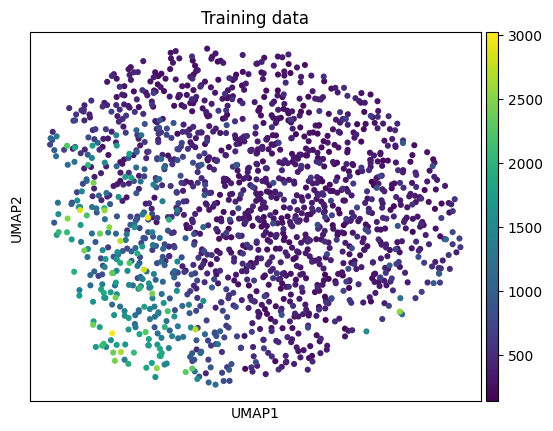

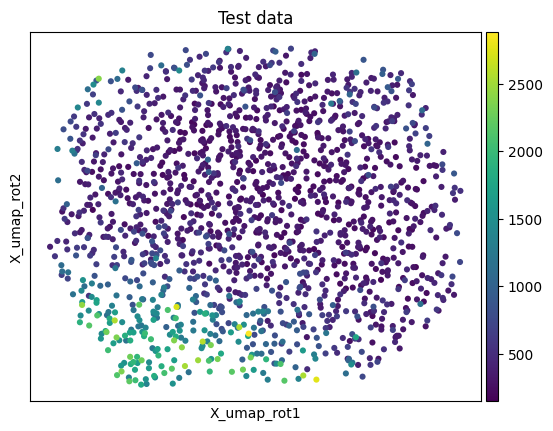

In [64]:
sc.pl.umap(data_train, color="total_counts", cmap="viridis", title="Training data")
plt.show()

sc.pl.embedding(data_test, basis="X_umap_rot", color="total_counts", cmap="viridis", title="Test data")
plt.show()

In [65]:
importlib.reload(co)
res_min = 0.01
res_max = 0.5
res_step = 0.02
resolutions = np.round(np.arange(res_min, res_max, res_step), 2)

co.cluster_train_test(data_train, data_test, resolutions, alg="leiden")

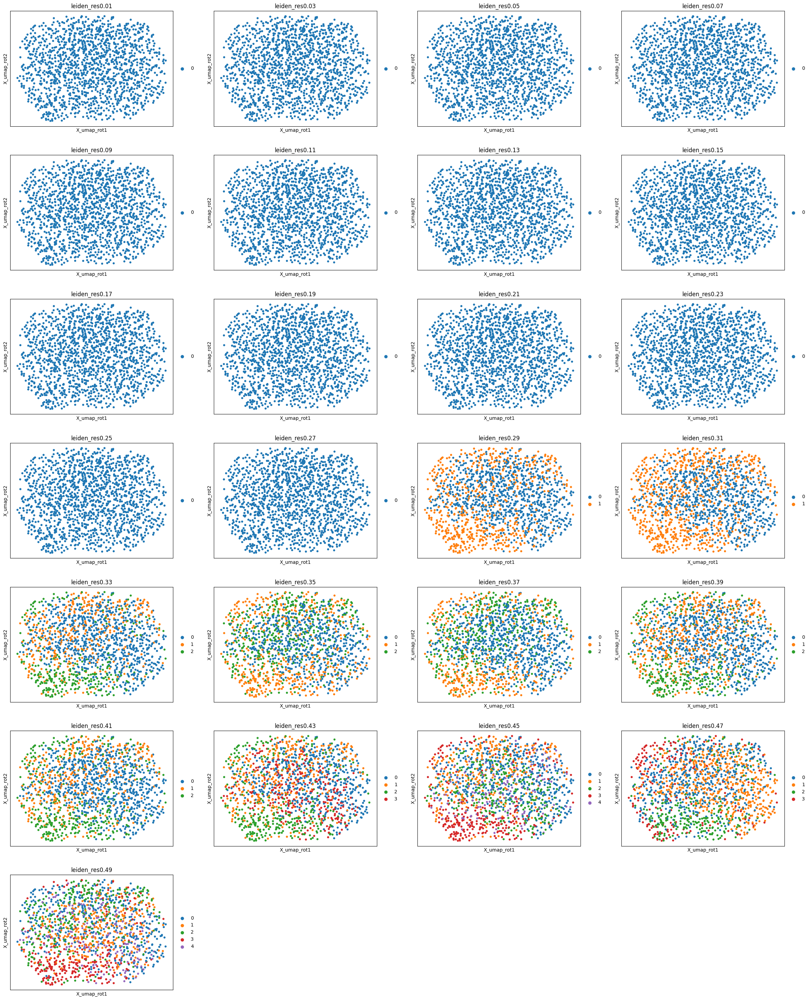

In [66]:
sc.pl.embedding(data_test, basis="X_umap_rot", color=[f"leiden_res{resolution}" for resolution in resolutions])
plt.show()

In [67]:
importlib.reload(co)
mod_df, mod_df_wide, res_opt = co.find_optimal_clustering_resolution(data_train, data_test, resolutions)

print(f"Optimal resolution {res_opt}")

resolution: 0.01 - clusters: 1 - Train: 0.49 - Test: 0.49 - Random: 0.49
resolution: 0.03 - clusters: 1 - Train: 0.47 - Test: 0.47 - Random: 0.47
resolution: 0.05 - clusters: 1 - Train: 0.45 - Test: 0.45 - Random: 0.45
resolution: 0.07 - clusters: 1 - Train: 0.43 - Test: 0.43 - Random: 0.43
resolution: 0.09 - clusters: 1 - Train: 0.41 - Test: 0.41 - Random: 0.41
resolution: 0.11 - clusters: 1 - Train: 0.39 - Test: 0.39 - Random: 0.39
resolution: 0.13 - clusters: 1 - Train: 0.37 - Test: 0.37 - Random: 0.37
resolution: 0.15 - clusters: 1 - Train: 0.35 - Test: 0.35 - Random: 0.35
resolution: 0.17 - clusters: 1 - Train: 0.33 - Test: 0.33 - Random: 0.33
resolution: 0.19 - clusters: 1 - Train: 0.31 - Test: 0.31 - Random: 0.31
resolution: 0.21 - clusters: 1 - Train: 0.29 - Test: 0.29 - Random: 0.29
resolution: 0.23 - clusters: 1 - Train: 0.27 - Test: 0.27 - Random: 0.27
resolution: 0.25 - clusters: 1 - Train: 0.25 - Test: 0.25 - Random: 0.25
resolution: 0.27 - clusters: 1 - Train: 0.23 - Test

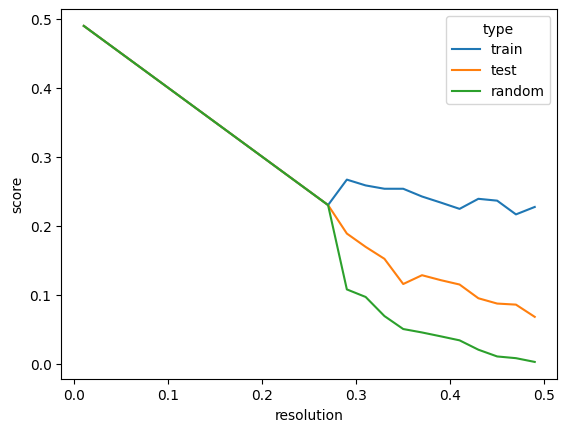

In [68]:
sns.lineplot(data=mod_df, x="resolution", y="score", hue="type")
plt.show()

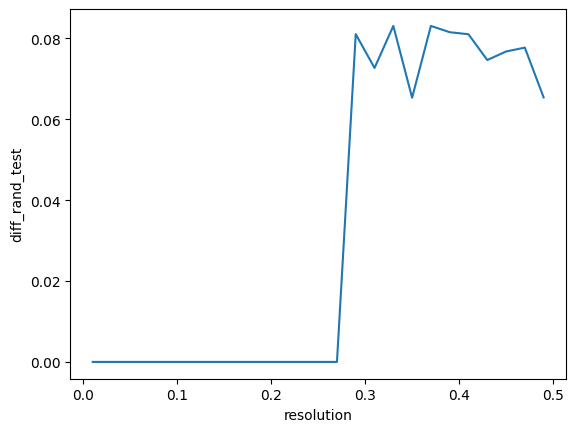

In [69]:
sns.lineplot(data=mod_df_wide, x="resolution", y="diff_rand_test")
plt.show()

In [70]:
sc.tl.leiden(data_counts, resolution=res_opt, key_added="leiden_opt")

In [71]:
data_counts

AnnData object with n_obs × n_vars = 1544 × 5553
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale', 'embedding_reliability', 'reliability_score', 'null_reliability_score', 'leiden_opt'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp', 'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs', 'mean', 'std'
    uns: 'pca', 'neighbors', 'umap', 'embedding_reliability_colors', 'leiden_opt', 'leiden_opt_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_3b', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'vst_counts'
    obsp: 'distances', 'connectivities'

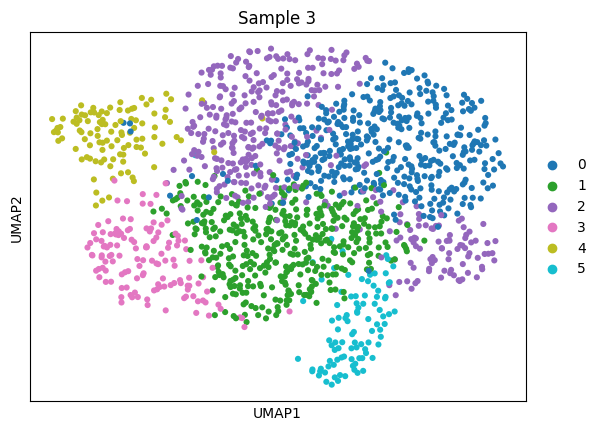

In [72]:
sc.pl.umap(data_counts, color="leiden_opt", palette="tab10", title="Sample 3")
plt.show()

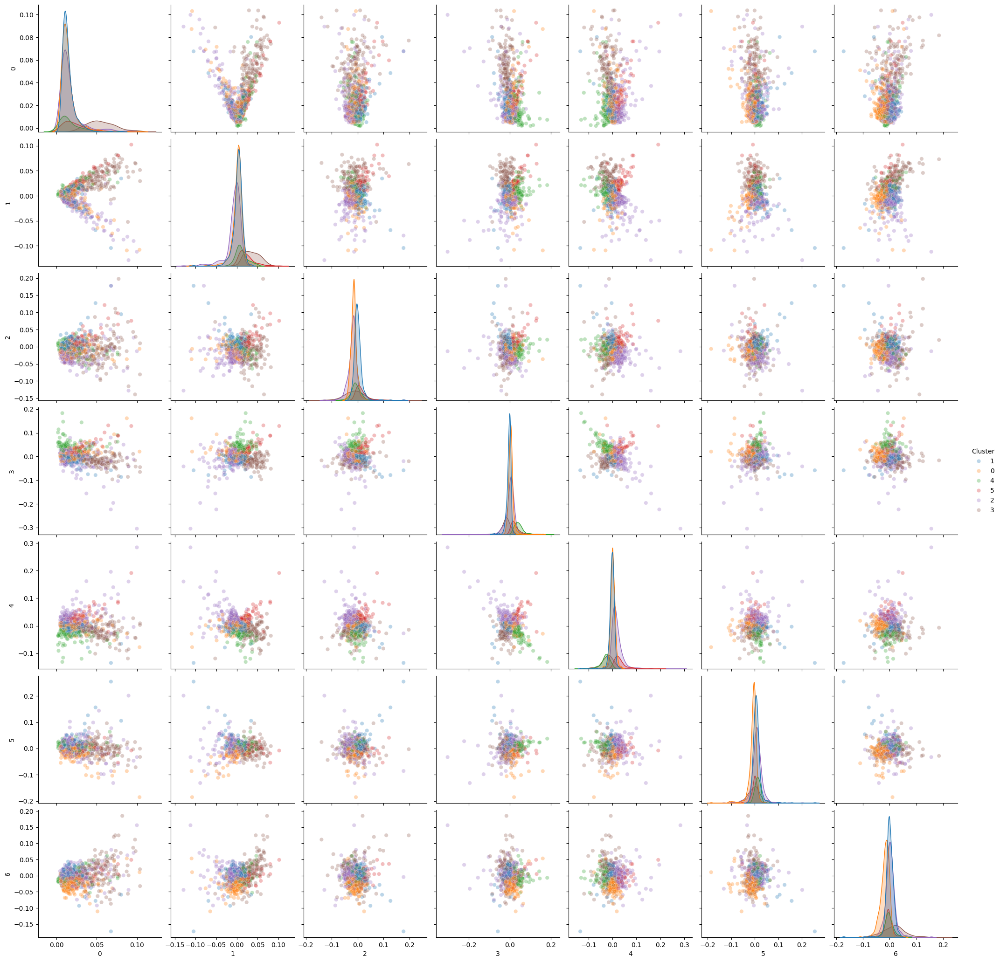

In [73]:
nmd_plot.plot_embedding_grid(data_counts.obsm["X_3b"], hue=data_counts.obs["leiden_opt"], size=3)


In [74]:
pd.crosstab(data_all_pca.obs["leiden_opt"], data_counts.obs["leiden_opt"], rownames=['PCA'], colnames=['NMD'])

NMD,0,1,2,3,4,5
PCA,,,,,,
0,203,183,123,1,6,1
1,137,103,237,0,2,3
2,72,113,37,132,27,90
3,4,1,0,0,69,0


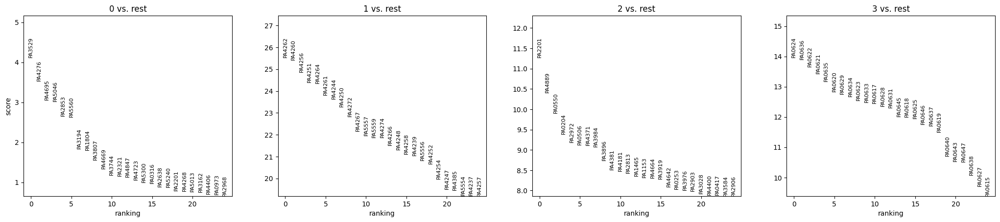

In [75]:
sc.tl.rank_genes_groups(data_all_pca, 'leiden_opt', method='wilcoxon')
sc.pl.rank_genes_groups(data_all_pca, n_genes=25, sharey=False)

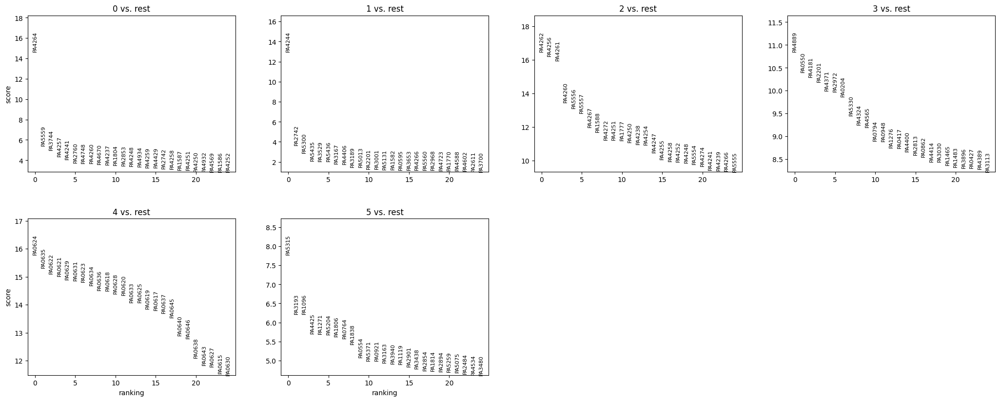

In [76]:
sc.tl.rank_genes_groups(data_counts, 'leiden_opt', method='wilcoxon')
sc.pl.rank_genes_groups(data_counts, n_genes=25, sharey=False)

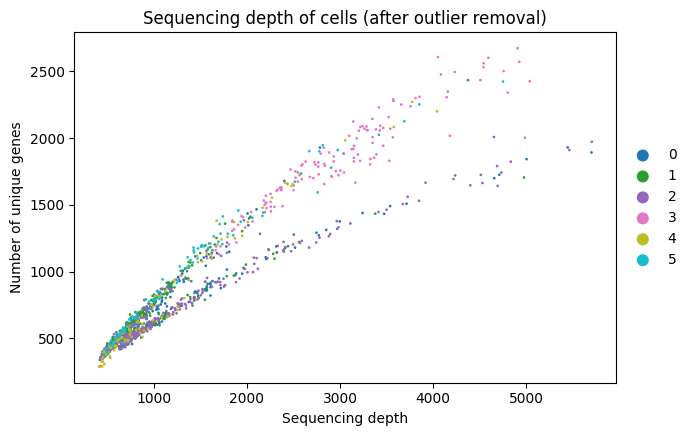

In [77]:
sc.pl.scatter(data_counts, x='total_counts', y='n_genes_by_counts', show=False, size=15, color="leiden_opt")
plt.title("Sequencing depth of cells (after outlier removal)")
plt.xlabel("Sequencing depth")
plt.ylabel("Number of unique genes")
plt.show()

In [78]:
top_genes_3 = [x[1] for x in data_counts.uns["rank_genes_groups"]["names"]]
print(top_genes_3[:25])

['PA4244', 'PA2742', 'PA5300', 'PA5435', 'PA3529', 'PA5436', 'PA3167', 'PA4406', 'PA3189', 'PA5013', 'PA2201', 'PA3001', 'PA5131', 'PA1582', 'PA0595', 'PA3653', 'PA4266', 'PA5560', 'PA2968', 'PA4723', 'PA1770', 'PA4588', 'PA4602', 'PA2611', 'PA3700']


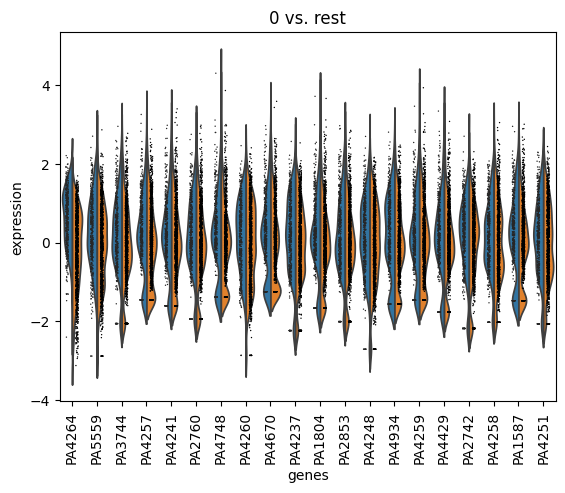

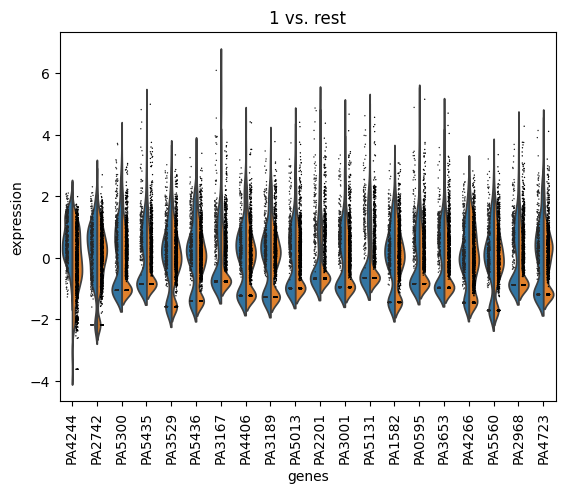

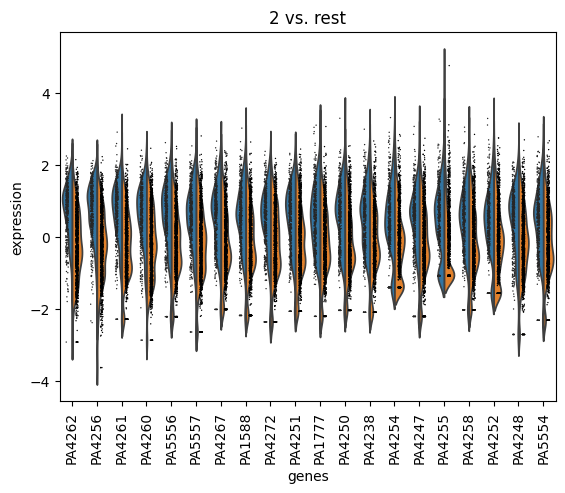

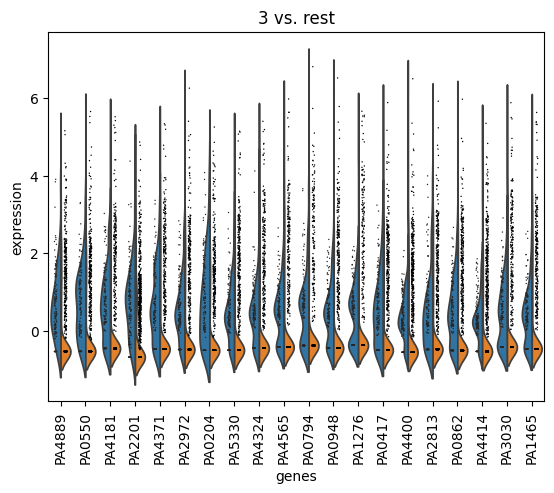

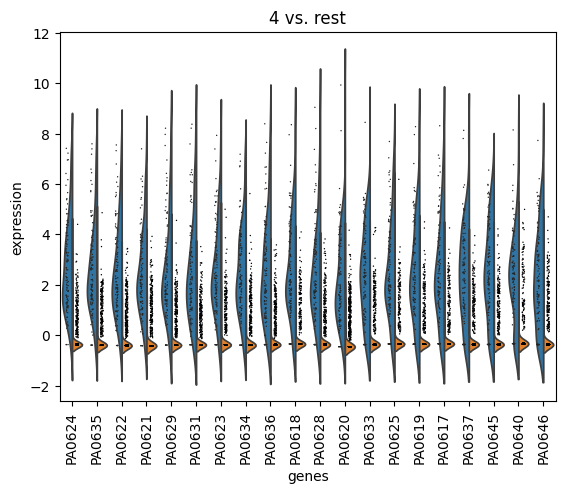

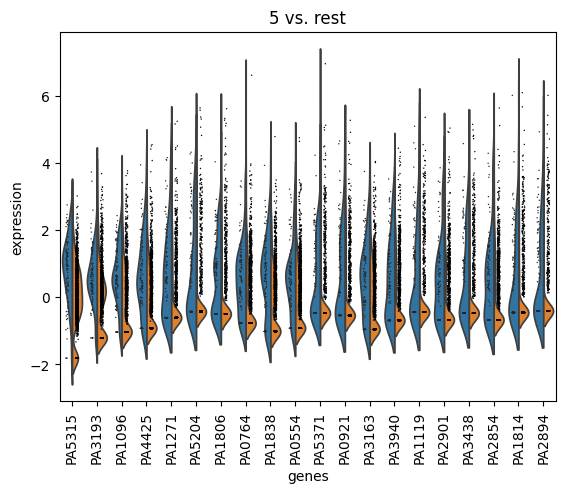

In [80]:
nclust = len(np.unique(data_counts.obs["leiden_opt"]))

for i in range(nclust):
    sc.pl.rank_genes_groups_violin(data_counts, groups=str(i), n_genes=20)